# Hyperspectral SegFormer MAE — EnMAP Reconstruction Exploration

Reconstruct EnMAP test scenes and visualize RGB, L1, and SAM residual maps.
No ground truth available — this is a qualitative exploration to see what the model
finds "hard to reconstruct" on a sensor it was trained on but scenes it hasn't seen.

### 1. Setup & Load Model

In [1]:
import os, sys, pathlib, json
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm

PROJECT_ROOT = str(pathlib.Path(os.getcwd()).parents[1])
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

from app.models.file_processing.sources import FileSourceConfig
from app.models.dataset.vendables import BandFilterConfig, DEFAULT_COMMON_WAVELENGTH_GRID
from app.utils.dataset_builder.enmap_dataset_builder import EnmapDatasetBuilder
from app.foundation_models.components.hyperspectral_seg_former_mae import HyperspectralSegFormerMAE
from app.foundation_models.components.token_masking import TokenMasking
from app.utils.patch_generation.generate_patch_plan import PatchPlanGenerator
from app.models.patches.patching_request import PatchRequest
from app.utils.torch_helpers.device_selection import get_device

# ── CONFIG ──
CHECKPOINT_PATH = os.path.join(PROJECT_ROOT, "checkpoints", "hyperspectral_segformer_mae_v0.1.0_epoch63.pt")  # UPDATE THIS
PIXEL_STATS_PATH = os.path.join(PROJECT_ROOT, "hyperspectral.json")

DEVICE = get_device()
PATCH_SIZE = 128
STRIDE = 64
INFERENCE_BATCH_SIZE = 8
CHECKERBOARD_CELL_SIZE = 1
EROSION_KERNEL_SIZE = 15

# EnMAP test scenes
ENMAP_SCENES = [
    os.path.join(PROJECT_ROOT, "tests/test_payloads", d)
    for d in sorted(os.listdir(os.path.join(PROJECT_ROOT, "tests/test_payloads")))
    if d.startswith("ENMAP")
]

print(f"Device: {DEVICE}")
print(f"EnMAP scenes found: {len(ENMAP_SCENES)}")
for s in ENMAP_SCENES:
    print(f"  {os.path.basename(s)[:60]}...")

# Load pixel stats
with open(PIXEL_STATS_PATH) as f:
    stats = json.load(f)
pixel_mean = stats["mean"]
pixel_std = stats["std"]

# Load model
ckpt = torch.load(CHECKPOINT_PATH, map_location=DEVICE, weights_only=False)
model = HyperspectralSegFormerMAE(
    in_channels=165, compressed_channels=24,
    embed_dims=[32, 64, 160, 256], num_heads=[1, 2, 5, 8],
    reduction_ratios=[8, 4, 2, 1], num_blocks=[2, 2, 2, 2],
    decoder_dim=256, drop_rate=0.0,
    pixel_mean=pixel_mean, pixel_std=pixel_std,
)
model.load_state_dict(ckpt["model_state_dict"])
model.to(DEVICE)
model.eval()

epoch = ckpt.get("epoch", "?")
print(f"Loaded checkpoint: epoch={epoch}")
print(f"Parameters: {sum(p.numel() for p in model.parameters()):,}")

Device: mps
EnMAP scenes found: 5
  ENMAP01-____L2A-DT0000059367_20240128T063655Z_018_V010506_20...
  ENMAP01-____L2A-DT0000118813_20250309T052400Z_002_V010506_20...
  ENMAP01-____L2A-DT0000157567_20251013T061429Z_019_V010506_20...
  ENMAP01-____L2A-DT0000169460_20251219T051408Z_014_V010506_20...
  ENMAP01-____L2A-DT0000180781_20260227T052837Z_002_V010506_20...
Loaded checkpoint: epoch=63
Parameters: 5,204,829


### 2. Reconstruction Helpers

In [2]:
STAGE1_KERNEL = 4
STAGE1_STRIDE = 4
STAGE1_PADDING = 0


def two_pass_reconstruct_batch(model, patches, masks, device, cell_size=1):
    B, C, H, W = patches.shape
    H_t, W_t = H // STAGE1_STRIDE, W // STAGE1_STRIDE
    checker = TokenMasking.checkerboard_token_mask(H_t, W_t, cell_size=cell_size, device=device, invert=False)
    token_validity = TokenMasking.pixel_mask_to_token_mask(masks, kernel_size=STAGE1_KERNEL, stride=STAGE1_STRIDE, padding=STAGE1_PADDING)
    pred_mask_1 = token_validity * (1.0 - checker)
    keep_mask_1 = 1.0 - pred_mask_1
    x_hat_1 = model(patches, mask=masks, keep_mask=keep_mask_1)
    pred_mask_2 = token_validity * checker
    keep_mask_2 = 1.0 - pred_mask_2
    x_hat_2 = model(patches, mask=masks, keep_mask=keep_mask_2)
    pass1_px = F.interpolate(pred_mask_1.reshape(B, 1, H_t, W_t), size=(H, W), mode="nearest")
    pass2_px = F.interpolate(pred_mask_2.reshape(B, 1, H_t, W_t), size=(H, W), mode="nearest")
    return (x_hat_1 * pass1_px + x_hat_2 * pass2_px) * masks


@torch.no_grad()
def reconstruct_full_scene(model, scene, mask, device, patch_size=128, stride=64,
                           batch_size=8, cell_size=1, erosion_ks=15, min_valid=0.1):
    scene, mask = scene.to(device), mask.to(device)
    C, H, W = scene.shape
    eroded_mask = TokenMasking.erode_mask(mask.unsqueeze(0), kernel_size=erosion_ks).squeeze(0)
    plan = PatchPlanGenerator().generate_patching_plan(
        PatchRequest(input_cube=(C, H, W), width=patch_size, height=patch_size, stride=stride))
    coords = plan.patch_coordinates
    recon_sum = torch.zeros(C, H, W, device=device)
    count = torch.zeros(1, H, W, device=device)
    total_batches = (len(coords) + batch_size - 1) // batch_size

    for batch_start in tqdm(range(0, len(coords), batch_size), total=total_batches, desc="Reconstructing", unit="batch"):
        batch_coords = coords[batch_start:batch_start + batch_size]
        all_patches = [scene[:, r:r+patch_size, c:c+patch_size] for r, c in batch_coords]
        all_masks = [mask[:, r:r+patch_size, c:c+patch_size] for r, c in batch_coords]
        valid_idx = [i for i, m in enumerate(all_masks) if m.float().mean() >= min_valid]
        if not valid_idx:
            continue
        patches = torch.stack([all_patches[i] for i in valid_idx])
        patch_masks = torch.stack([all_masks[i] for i in valid_idx])
        recon = two_pass_reconstruct_batch(model, patches, patch_masks, device, cell_size)
        for j, idx in enumerate(valid_idx):
            r, c = batch_coords[idx]
            pe = eroded_mask[:, r:r+patch_size, c:c+patch_size]
            recon_sum[:, r:r+patch_size, c:c+patch_size] += recon[j] * pe
            count[:, r:r+patch_size, c:c+patch_size] += pe

    return torch.where(count > 0, recon_sum / count, scene)


def compute_scores(original, reconstruction, mask):
    l1 = (original - reconstruction).abs().mean(dim=0)
    dot = (original * reconstruction).sum(dim=0, keepdim=True)
    norm_o = (original * original).sum(dim=0, keepdim=True).add(1e-8).sqrt()
    norm_r = (reconstruction * reconstruction).sum(dim=0, keepdim=True).add(1e-8).sqrt()
    cos_sim = (dot / (norm_o * norm_r)).clamp(-1.0, 1.0)
    sam = torch.acos(cos_sim).squeeze(0)
    sv = mask[0]
    return (l1 * sv).cpu().numpy(), (sam * sv).cpu().numpy()


def make_rgb(cube, wl, validity=None):
    r = np.argmin(np.abs(wl - 650)); g = np.argmin(np.abs(wl - 550)); b = np.argmin(np.abs(wl - 450))
    rgb = np.stack([cube[r], cube[g], cube[b]], axis=-1).astype(np.float32)
    for ch in range(3):
        v = rgb[:,:,ch]
        vals = v[validity > 0] if validity is not None else v[v > 0]
        if len(vals) > 0:
            p2, p98 = np.percentile(vals, [2, 98])
            rgb[:,:,ch] = np.clip((v - p2) / (p98 - p2 + 1e-10), 0, 1)
    if validity is not None: rgb[validity == 0] = 0
    return rgb

print("Helpers ready.")

Helpers ready.


### 3. Build Vendables & Reconstruct All Scenes

In [3]:
band_filter_config = BandFilterConfig(common_wavelength_grid=DEFAULT_COMMON_WAVELENGTH_GRID)

scenes = {}
for idx, scene_path in enumerate(ENMAP_SCENES):
    scene_name = os.path.basename(scene_path)[:50]
    print(f"\n{'='*70}")
    print(f"  Scene {idx+1}/{len(ENMAP_SCENES)}: {scene_name}...")
    print(f"{'='*70}")

    print("  Building vendable...")
    builder = EnmapDatasetBuilder(
        file_source_configuration=FileSourceConfig(source_path=scene_path)
    )
    vendable = builder.vend_dataset(band_filter_config=band_filter_config)

    cube = vendable.normalized_hyperspectral_cube
    validity = vendable.validity_cube
    wavelengths = np.array(vendable.band_cw_order)
    spatial_valid = (validity.sum(axis=0) > 0).astype(np.uint8)
    C, H, W = cube.shape
    print(f"  Cube: ({C}, {H}, {W}), valid: {spatial_valid.mean()*100:.0f}%")

    scene_tensor = torch.from_numpy(cube).float()
    mask_tensor = torch.from_numpy(spatial_valid[None]).float()

    print(f"  Reconstructing...")
    recon = reconstruct_full_scene(
        model, scene_tensor, mask_tensor, DEVICE,
        patch_size=PATCH_SIZE, stride=STRIDE, batch_size=INFERENCE_BATCH_SIZE,
        cell_size=CHECKERBOARD_CELL_SIZE, erosion_ks=EROSION_KERNEL_SIZE,
    )

    l1_map, sam_map = compute_scores(scene_tensor.to(DEVICE), recon, mask_tensor.to(DEVICE))

    scenes[idx] = {
        "name": scene_name,
        "cube": cube,
        "recon": recon.cpu().numpy(),
        "validity": spatial_valid,
        "wavelengths": wavelengths,
        "l1_map": l1_map,
        "sam_map": sam_map,
    }

    valid_l1 = l1_map[spatial_valid == 1]
    valid_sam = sam_map[spatial_valid == 1]
    print(f"  L1:  mean={valid_l1.mean():.6f}, P99={np.percentile(valid_l1, 99):.6f}")
    print(f"  SAM: mean={valid_sam.mean()*180/np.pi:.2f}°, P99={np.percentile(valid_sam, 99)*180/np.pi:.2f}°")


  Scene 1/5: ENMAP01-____L2A-DT0000059367_20240128T063655Z_018_...
  Building vendable...
  Cube: (165, 1179, 1320), valid: 71%
  Reconstructing...


Reconstructing: 100%|██████████| 45/45 [00:07<00:00,  6.38batch/s]


  L1:  mean=0.010763, P99=0.040117
  SAM: mean=13.57°, P99=27.35°

  Scene 2/5: ENMAP01-____L2A-DT0000118813_20250309T052400Z_002_...
  Building vendable...
  Cube: (165, 1174, 1335), valid: 74%
  Reconstructing...


Reconstructing: 100%|██████████| 45/45 [00:07<00:00,  6.12batch/s]


  L1:  mean=0.014783, P99=0.056267
  SAM: mean=2.91°, P99=10.98°

  Scene 3/5: ENMAP01-____L2A-DT0000157567_20251013T061429Z_019_...
  Building vendable...
  Cube: (165, 1174, 1346), valid: 72%
  Reconstructing...


Reconstructing: 100%|██████████| 48/48 [00:06<00:00,  7.04batch/s]


  L1:  mean=0.011849, P99=0.045680
  SAM: mean=2.61°, P99=9.80°

  Scene 4/5: ENMAP01-____L2A-DT0000169460_20251219T051408Z_014_...
  Building vendable...
  Cube: (165, 1175, 1353), valid: 75%
  Reconstructing...


Reconstructing: 100%|██████████| 48/48 [00:07<00:00,  6.69batch/s]


  L1:  mean=0.013452, P99=0.046266
  SAM: mean=6.85°, P99=17.33°

  Scene 5/5: ENMAP01-____L2A-DT0000180781_20260227T052837Z_002_...
  Building vendable...
  Cube: (165, 1173, 1326), valid: 74%
  Reconstructing...


Reconstructing: 100%|██████████| 45/45 [00:09<00:00,  4.58batch/s]


  L1:  mean=0.014030, P99=0.064996
  SAM: mean=3.04°, P99=12.36°


### 4. Per-Scene Visualization: Original RGB, Reconstructed RGB, L1 Map, SAM Map

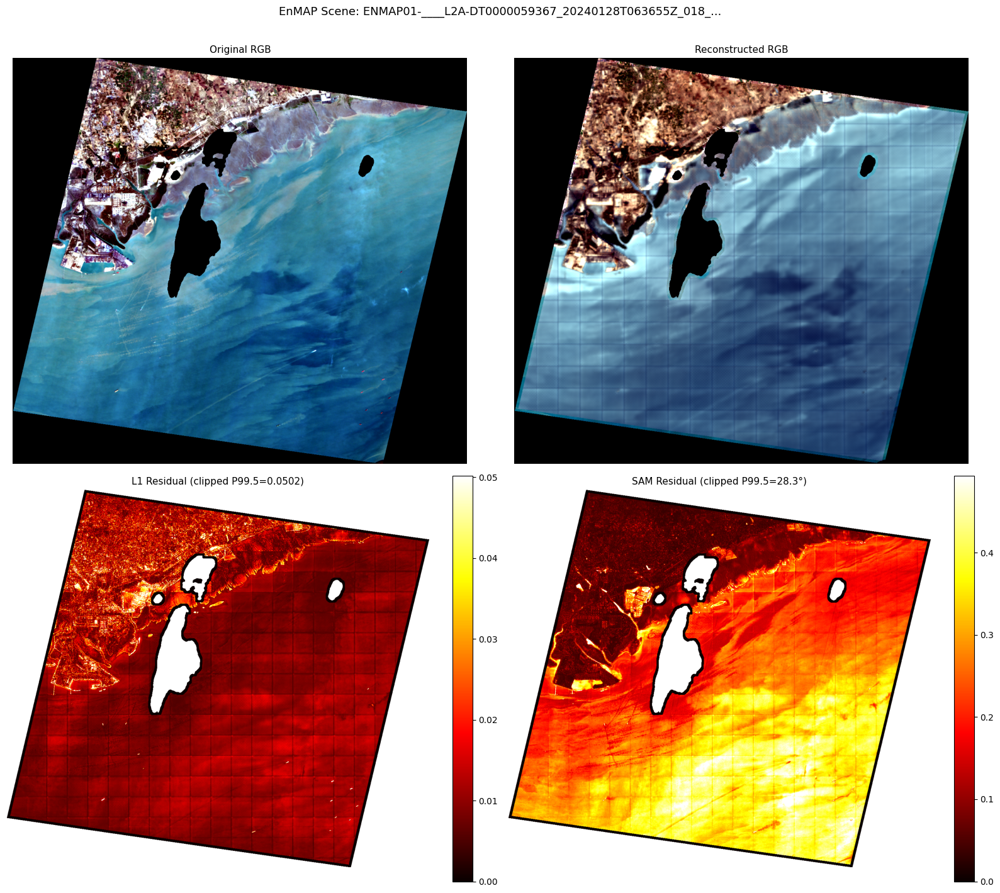

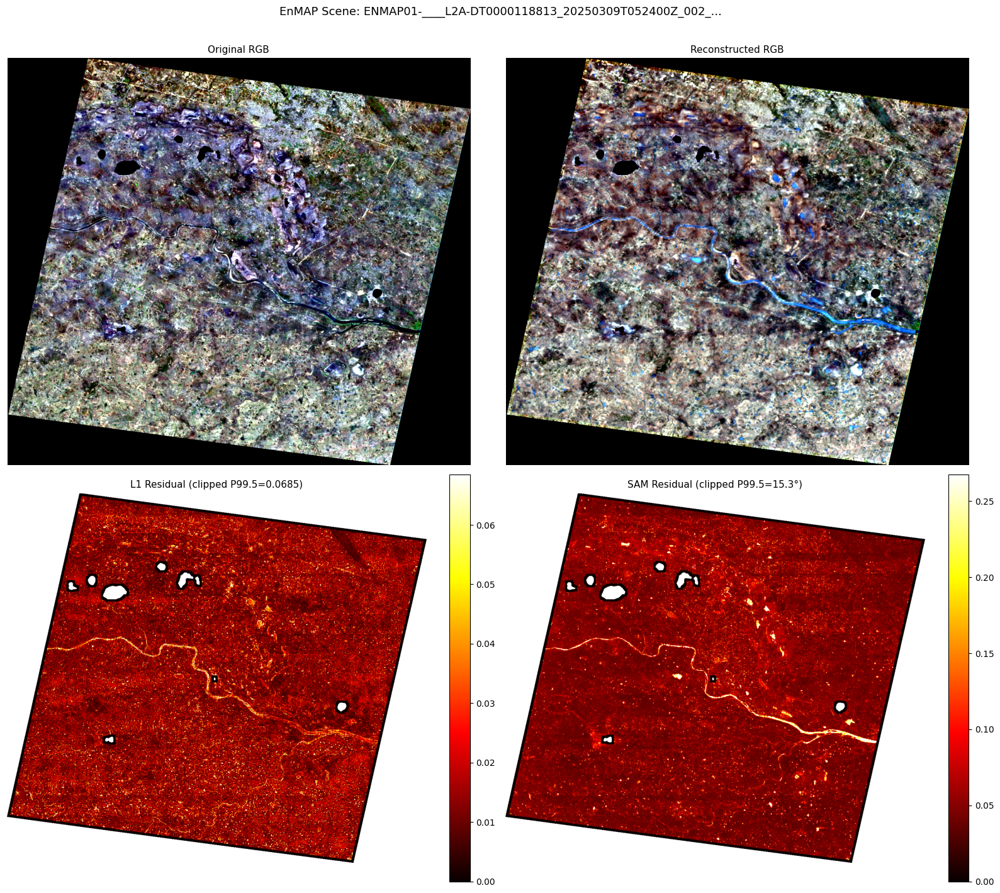

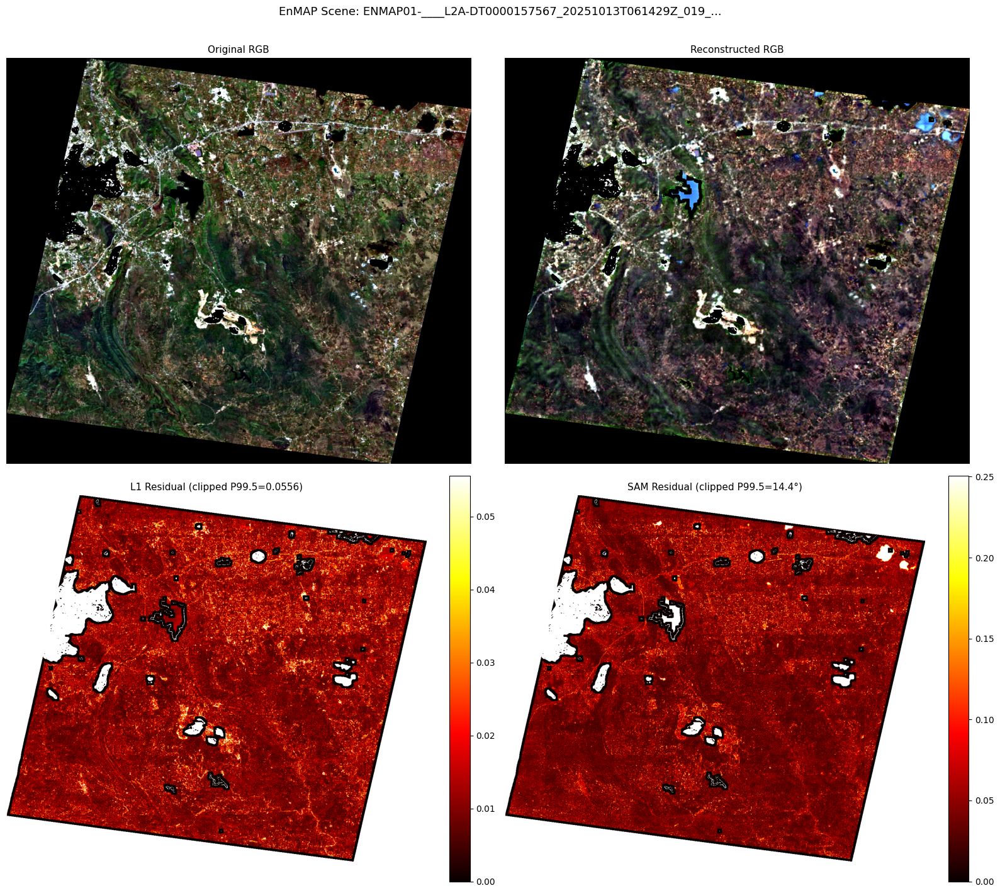

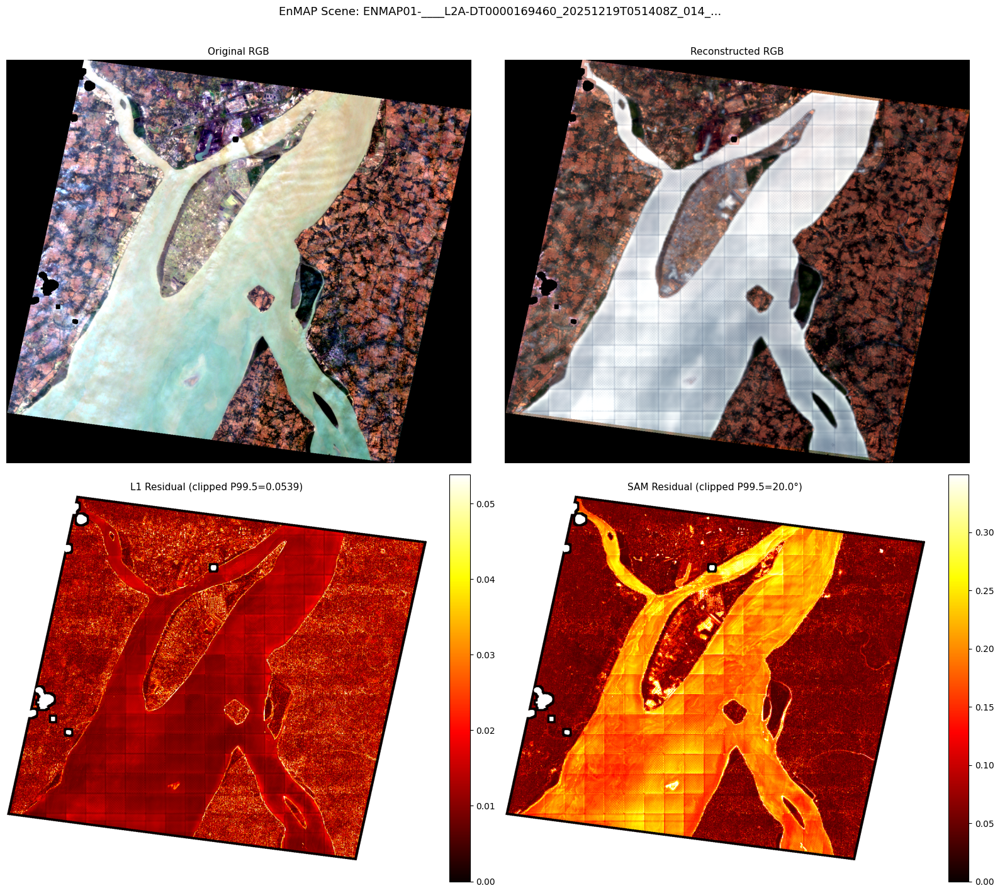

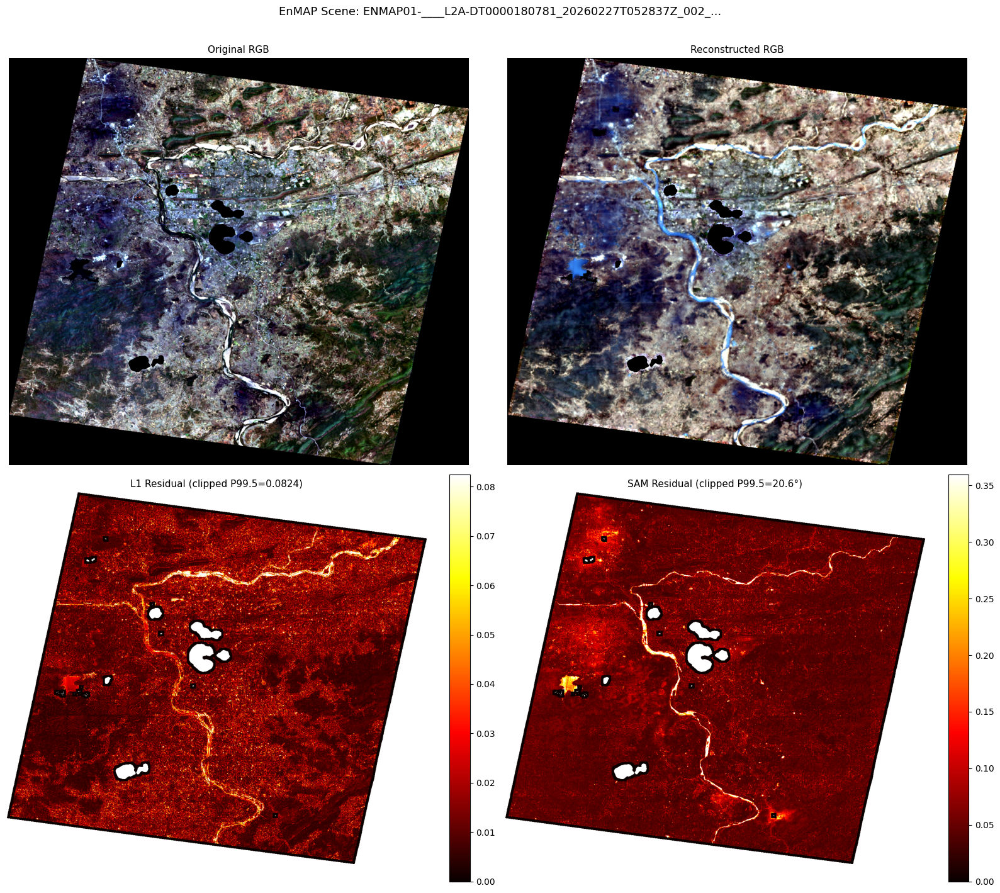

In [4]:
for idx in scenes:
    d = scenes[idx]
    sv = d["validity"]
    wl = d["wavelengths"]

    fig, axes = plt.subplots(2, 2, figsize=(16, 14))

    # Original RGB
    rgb_orig = make_rgb(d["cube"], wl, sv)
    axes[0, 0].imshow(rgb_orig)
    axes[0, 0].set_title("Original RGB", fontsize=11)
    axes[0, 0].axis("off")

    # Reconstructed RGB
    rgb_recon = make_rgb(d["recon"], wl, sv)
    axes[0, 1].imshow(rgb_recon)
    axes[0, 1].set_title("Reconstructed RGB", fontsize=11)
    axes[0, 1].axis("off")

    # L1 map
    l1_valid = d["l1_map"][sv == 1]
    clip_l1 = np.percentile(l1_valid, 99.5) if len(l1_valid) > 0 else 1.0
    l1_display = np.ma.masked_where(sv == 0, d["l1_map"])
    im1 = axes[1, 0].imshow(l1_display, cmap="hot", vmin=0, vmax=clip_l1)
    axes[1, 0].set_title(f"L1 Residual (clipped P99.5={clip_l1:.4f})", fontsize=11)
    axes[1, 0].axis("off")
    plt.colorbar(im1, ax=axes[1, 0], fraction=0.046)

    # SAM map
    sam_valid = d["sam_map"][sv == 1]
    clip_sam = np.percentile(sam_valid, 99.5) if len(sam_valid) > 0 else 1.0
    sam_display = np.ma.masked_where(sv == 0, d["sam_map"])
    im2 = axes[1, 1].imshow(sam_display, cmap="hot", vmin=0, vmax=clip_sam)
    axes[1, 1].set_title(f"SAM Residual (clipped P99.5={clip_sam*180/np.pi:.1f}°)", fontsize=11)
    axes[1, 1].axis("off")
    plt.colorbar(im2, ax=axes[1, 1], fraction=0.046)

    fig.suptitle(f"EnMAP Scene: {d['name']}...", fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()

### 5. Spectral Profiles — Random Pixels (Input vs Reconstruction)

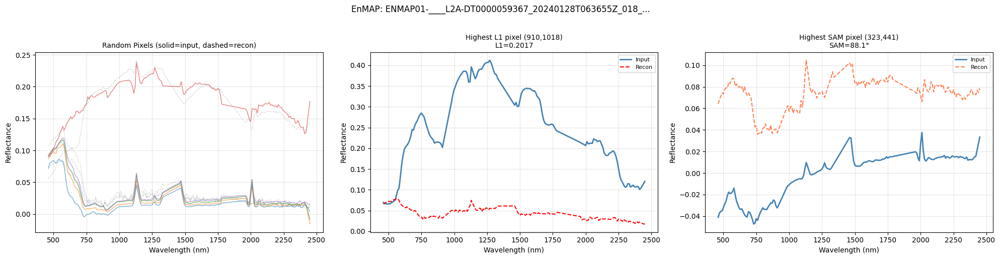

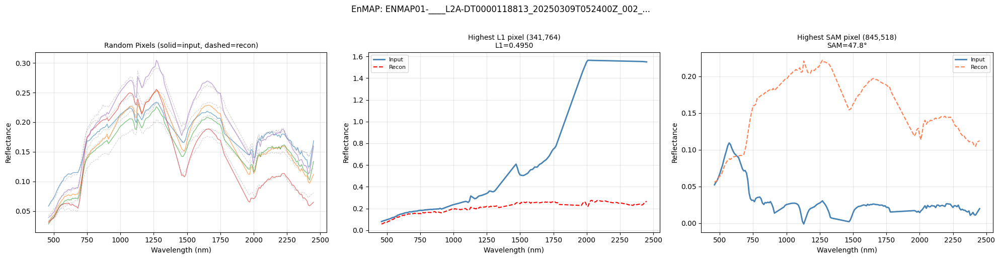

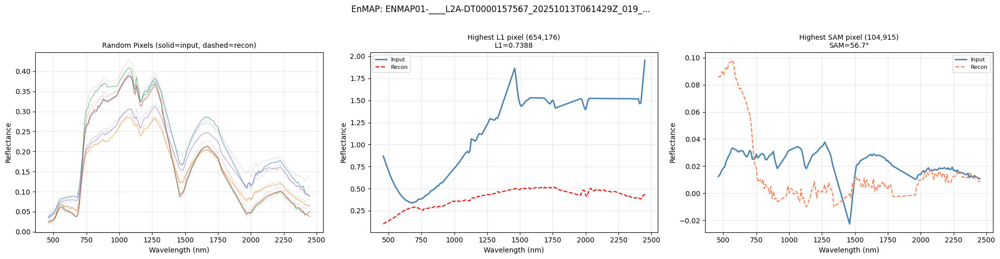

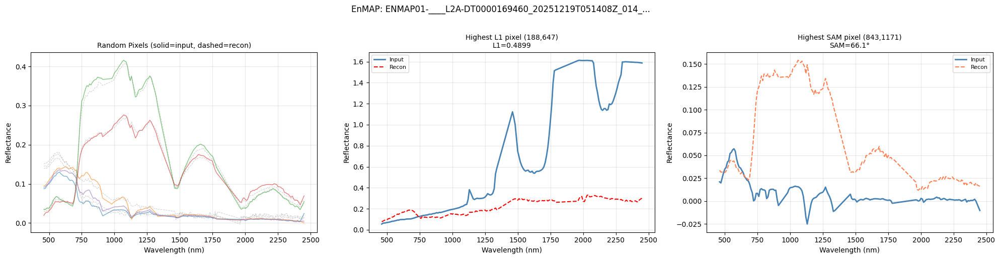

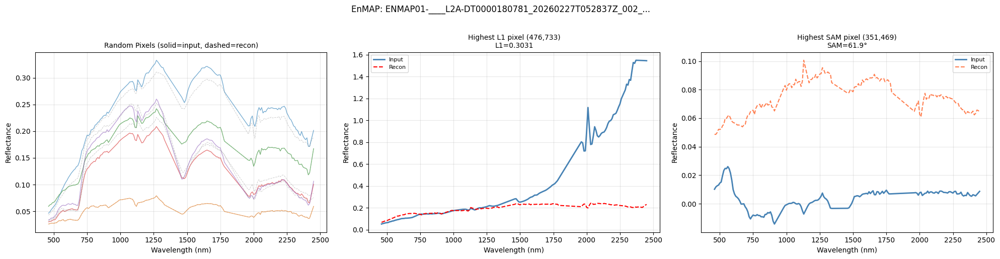

In [5]:
N_PIXELS = 5  # random pixels per scene

for idx in scenes:
    d = scenes[idx]
    wl = d["wavelengths"]
    sv = d["validity"]
    cube = d["cube"]
    recon = d["recon"]

    valid_px = np.argwhere(sv == 1)
    rng = np.random.default_rng(42 + idx)
    sample = valid_px[rng.choice(len(valid_px), N_PIXELS, replace=False)]

    # Also pick the pixel with highest L1 and highest SAM
    l1_flat = d["l1_map"].copy(); l1_flat[sv == 0] = 0
    sam_flat = d["sam_map"].copy(); sam_flat[sv == 0] = 0
    top_l1_px = np.unravel_index(l1_flat.argmax(), l1_flat.shape)
    top_sam_px = np.unravel_index(sam_flat.argmax(), sam_flat.shape)

    fig, axes = plt.subplots(1, 3, figsize=(20, 5))

    # Random pixel spectra
    for r, c in sample:
        axes[0].plot(wl, cube[:, r, c], lw=1, alpha=0.6)
        axes[0].plot(wl, recon[:, r, c], lw=0.7, alpha=0.4, linestyle="--", color="gray")
    axes[0].set_xlabel("Wavelength (nm)"); axes[0].set_ylabel("Reflectance")
    axes[0].set_title(f"Random Pixels (solid=input, dashed=recon)", fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # Highest L1 pixel
    r, c = top_l1_px
    axes[1].plot(wl, cube[:, r, c], lw=2, color="steelblue", label="Input")
    axes[1].plot(wl, recon[:, r, c], lw=1.5, color="red", linestyle="--", label="Recon")
    axes[1].set_xlabel("Wavelength (nm)"); axes[1].set_ylabel("Reflectance")
    axes[1].set_title(f"Highest L1 pixel ({r},{c})\nL1={d['l1_map'][r,c]:.4f}", fontsize=10)
    axes[1].legend(fontsize=8); axes[1].grid(True, alpha=0.3)

    # Highest SAM pixel
    r, c = top_sam_px
    axes[2].plot(wl, cube[:, r, c], lw=2, color="steelblue", label="Input")
    axes[2].plot(wl, recon[:, r, c], lw=1.5, color="coral", linestyle="--", label="Recon")
    axes[2].set_xlabel("Wavelength (nm)"); axes[2].set_ylabel("Reflectance")
    axes[2].set_title(f"Highest SAM pixel ({r},{c})\nSAM={d['sam_map'][r,c]*180/np.pi:.1f}°", fontsize=10)
    axes[2].legend(fontsize=8); axes[2].grid(True, alpha=0.3)

    fig.suptitle(f"EnMAP: {d['name']}...", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()

### 6. L1 & SAM Histograms

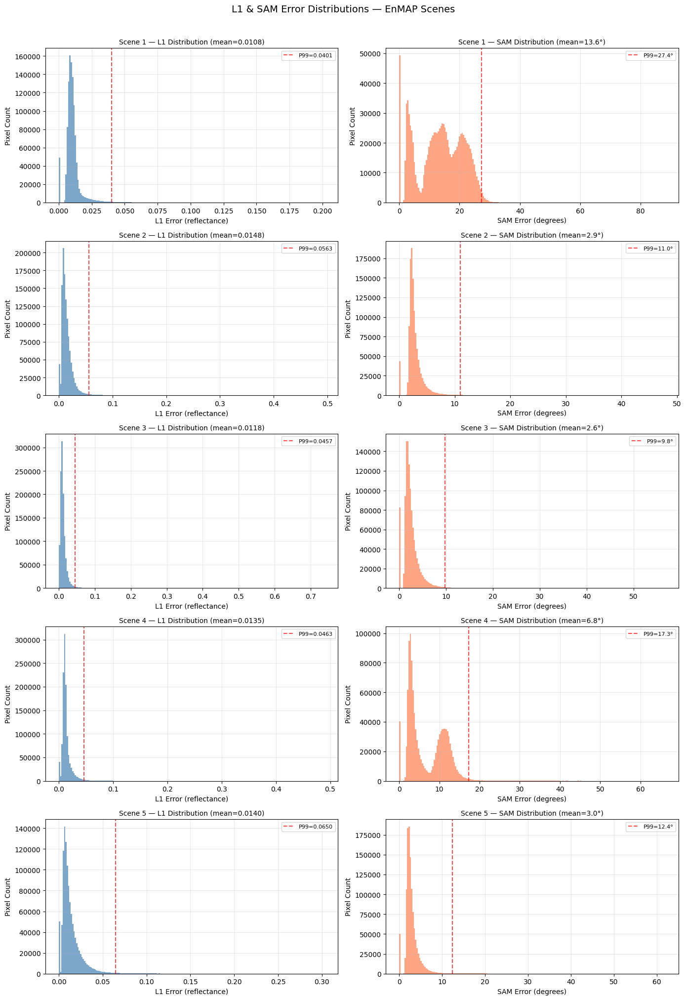

In [6]:
n_scenes = len(scenes)
fig, axes = plt.subplots(n_scenes, 2, figsize=(14, 4 * n_scenes))
if n_scenes == 1:
    axes = axes[None, :]

for idx in scenes:
    d = scenes[idx]
    sv = d["validity"]
    l1_valid = d["l1_map"][sv == 1]
    sam_valid = d["sam_map"][sv == 1] * 180 / np.pi  # degrees

    axes[idx, 0].hist(l1_valid, bins=200, color="steelblue", alpha=0.7, edgecolor="none")
    axes[idx, 0].axvline(np.percentile(l1_valid, 99), color="red", linestyle="--", alpha=0.7, label=f"P99={np.percentile(l1_valid, 99):.4f}")
    axes[idx, 0].set_xlabel("L1 Error (reflectance)")
    axes[idx, 0].set_ylabel("Pixel Count")
    axes[idx, 0].set_title(f"Scene {idx+1} — L1 Distribution (mean={l1_valid.mean():.4f})", fontsize=10)
    axes[idx, 0].legend(fontsize=8)
    axes[idx, 0].grid(True, alpha=0.3)

    axes[idx, 1].hist(sam_valid, bins=200, color="coral", alpha=0.7, edgecolor="none")
    axes[idx, 1].axvline(np.percentile(sam_valid, 99), color="red", linestyle="--", alpha=0.7, label=f"P99={np.percentile(sam_valid, 99):.1f}°")
    axes[idx, 1].set_xlabel("SAM Error (degrees)")
    axes[idx, 1].set_ylabel("Pixel Count")
    axes[idx, 1].set_title(f"Scene {idx+1} — SAM Distribution (mean={sam_valid.mean():.1f}°)", fontsize=10)
    axes[idx, 1].legend(fontsize=8)
    axes[idx, 1].grid(True, alpha=0.3)

plt.suptitle("L1 & SAM Error Distributions — EnMAP Scenes", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

### 7. Summary

In [7]:
print(f"{'='*80}")
print(f"{'ENMAP RECONSTRUCTION SUMMARY':^80}")
print(f"{'='*80}")
print(f"  Checkpoint: epoch {epoch}")
print(f"  Patch: {PATCH_SIZE}x{PATCH_SIZE}, stride {STRIDE}")
print()
print(f"{'Scene':<55} {'Mean L1':>10} {'Mean SAM':>10}")
print(f"{'-'*78}")

for idx in scenes:
    d = scenes[idx]
    sv = d["validity"]
    l1_mean = d["l1_map"][sv == 1].mean()
    sam_mean = d["sam_map"][sv == 1].mean() * 180 / np.pi
    print(f"  {d['name'][:52]:<55} {l1_mean:>9.6f} {sam_mean:>8.2f}°")

                          ENMAP RECONSTRUCTION SUMMARY                          
  Checkpoint: epoch 63
  Patch: 128x128, stride 64

Scene                                                      Mean L1   Mean SAM
------------------------------------------------------------------------------
  ENMAP01-____L2A-DT0000059367_20240128T063655Z_018_       0.010763    13.57°
  ENMAP01-____L2A-DT0000118813_20250309T052400Z_002_       0.014783     2.91°
  ENMAP01-____L2A-DT0000157567_20251013T061429Z_019_       0.011849     2.61°
  ENMAP01-____L2A-DT0000169460_20251219T051408Z_014_       0.013452     6.85°
  ENMAP01-____L2A-DT0000180781_20260227T052837Z_002_       0.014030     3.04°
